# PROJECT TEAM ID: PTID-CDS-MAY-23-1518

# PRCP-1003-Customer Transaction Prediction

## Problem Statement :

### Task 1:-Prepare a complete data analysis report on the given data.

### Task 2:-Create a predictive model which will help the bank to identify which customer will make transactions in future.


## Dataset Information:
### The dataset is anonymized so we cannot know which feature is what. There are a total of 200 features in this data set along with ID_code and target columns. The target columns contain 0 and 1 value where 0 means the customer will not do a transaction and 1 means the customer will do a transaction.

## Buisness case:
### To predict whether a customer will perform a specific transaction in the future or not, irrespective of the amount of money transacted. 

##### Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
from scipy import stats

# to visualise all the columns in the dataframe
pd.pandas.set_option('display.max_columns', None)

# importing metrics for model evaluation
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix, f1_score, recall_score, precision_score

In [2]:
# To Avoid Warnings
import warnings

warnings.filterwarnings('ignore')

In [3]:
data=pd.read_csv('train(1).csv')

#### Basic Checks

In [4]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

In [5]:
data.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,3.7574,-9.5348,13.9860,5.2982,8.2705,14.1527,7.4540,-5.0105,12.0465,8.6349,9.9137,25.1376,1.0914,3.2326,7.7802,13.9939,2.9085,0.1005,4.2369,7.5665,-9.2149,9.5746,1.4012,7.4211,11.0075,7.8080,4.5567,4.9861,9.7471,0.0722,5.9053,8.1743,10.8800,11.1665,4.2600,-2.1296,8.7833,-15.5727,-8.4916,22.1905,12.4110,15.1168,1.6041,6.1868,10.9576,18.7371,15.2986,5.7322,5.1244,9.8225,14.0315,-23.6064,-1.3403,-2.5577,6.3582,-5.4557,5.6063,7.0054,5.0171,-5.0055,28.9502,1.2297,4.4918,19.5568,20.8357,19.2136,17.6422,17.9836,4.0395,14.0761,-5.7878,16.3870,-14.1721,-13.0269,-2.5955,21.4526,15.6163,0.9845,8.2110,-0.8553,-12.1682,6.7779,7.3895,10.5084,15.5057,-0.6812,5.8999,6.1825,3.1038,-1.6930,-18.8473,9.9358,25.3359,1.3647,11.8509,5.0357,6.4630,18.4008,14.3787,19.0369,-0.6364,6.9155,3.6763,3.1460,4.9442,-1.8289,1.3521,34.6265,-0.6869,-5.3781,20.5030,10.9614,4.9677,6.1408,2.2575,12.8757,14.2253,-1.2868,0.2212,16.8661,12.7663,1.2414,7.1304,7.4108,-6.3369,3.0760,24.9796,20.3410,5.3312,23.7116,2.4745,11.2013,17.8165,13.0057,9.5506,5.3589,13.2491,-3.3068,3.6998,2.5927,14.3025,8.1596,7.9609,18.3343,4.3086,1.3546,12.4158,-5.3985,16.3683,10.4522,35.4923,5.5477,7.4244,12.5459,-6.7840,31.1895,2.6529,-11.1867,9.8865,5.4730,-5.3880,-0.4698,24.4025,-5.4493,11.3529,7.7075,-5.0491,13.0756,15.8271,3.3580,-14.3371,10.4421,7.6530,9.4585,22.7783,-4.0305,4.2233,-6.3906,13.5058,-0.4594,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,6.5576,-11.8776,14.4131,3.3087,3.5800,14.1597,7.5191,-8.8715,17.9467,17.0237,6.6459,18.2345,0.8982,2.2532,15.4977,13.3282,5.2281,-3.7424,5.5144,5.7148,-13.7470,7.4369,1.3041,12.7552,12.5362,-1.1002,2.4370,6.2631,14.8565,-2.9862,-7.8820,7.1320,11.8869,11.4218,8.9282,-27.2007,14.5962,-19.8502,26.0775,24.3915,12.6910,10.2453,6.8173,4.5666,-9.5685,18.4685,16.9534,7.3660,4.7038,9.4559,6.0037,-10.8728,0.7859,4.7000,7.8077,-1.7926,6.1534,12.9087,5.0398,-0.4247,22.6256,0.7166,0.6533,13.5821,20.3267,25.5380,14.0155,17.3326,4.2046,14.0195,11.4812,17.9954,-18.3549,-3.4537,1.1233,22.3135,1.9795,16.0239,4.7492,0.2446,-39.6406,6.9473,9.9392,11.1977,14.1006,-0.8012,18.8214,32.9827,1.7989,-0.2476,-15.5294,9.5501,11.8548,1.5127,11.3998,4.2304,6.6777,11.3434,14.2993,13.1205,13.3224,7.3143,3.6817,9.7780,4.0491,2.7221,4.4344,3.7648,2.1927,-2.9197,23.0679,12.2112,

In [6]:
data

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

In [7]:
# to visualise reset the columns in the dataframe
pd.pandas.reset_option('display.max_columns', None)

In [8]:
# Getting all columns from the dataset

data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [9]:
# To get number of rows and columns of the dataset

data.shape

(200000, 202)

***Observation:
    The dataset contains 200000 observations and 202 attributes***

In [10]:
# To find unique value in target

data["target"].unique()

array([0, 1], dtype=int64)

In [11]:
data["target"].value_counts() # for count of target values

0    179902
1     20098
Name: target, dtype: int64

***Observation:
    The target 0 has occured 179902 times and 1 has occured 20098 times, since more data is collected upon zero this is an unbalanced data***

In [12]:
data["target"].agg(["count","min","max"])# min,max,count

count    200000
min           0
max           1
Name: target, dtype: int64

In [13]:
data["target"].isnull().sum()

0

In [14]:
# To check all the null values from the dataset

data.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

In [15]:
# Print a concise summary of a DataFrame. 
# This method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage.

data.info

<bound method DataFrame.info of              ID_code  target    var_0   var_1    var_2   var_3    var_4  \
0            train_0       0   8.9255 -6.7863  11.9081  5.0930  11.4607   
1            train_1       0  11.5006 -4.1473  13.8588  5.3890  12.3622   
2            train_2       0   8.6093 -2.7457  12.0805  7.8928  10.5825   
3            train_3       0  11.0604 -2.1518   8.9522  7.1957  12.5846   
4            train_4       0   9.8369 -1.4834  12.8746  6.6375  12.2772   
...              ...     ...      ...     ...      ...     ...      ...   
199995  train_199995       0  11.4880 -0.4956   8.2622  3.5142  10.3404   
199996  train_199996       0   4.9149 -2.4484  16.7052  6.6345   8.3096   
199997  train_199997       0  11.2232 -5.0518  10.5127  5.6456   9.3410   
199998  train_199998       0   9.7148 -8.6098  13.6104  5.7930  12.5173   
199999  train_199999       0  10.8762 -5.7105  12.1183  8.0328  11.5577   

          var_5   var_6    var_7  ...  var_190  var_191  var_192  v

In [16]:
# To check the type of features.

data.dtypes

ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 202, dtype: object

## Target Analysis
### This column signifies whether the customer will do the transaction or not.


* 0  the customer will not do a transaction and
* 1  the customer will do a transaction.

## Exploratory Data Analysis(EDA)
##### Since feature names are not provided we are skipping EDA

<AxesSubplot:xlabel='target', ylabel='count'>

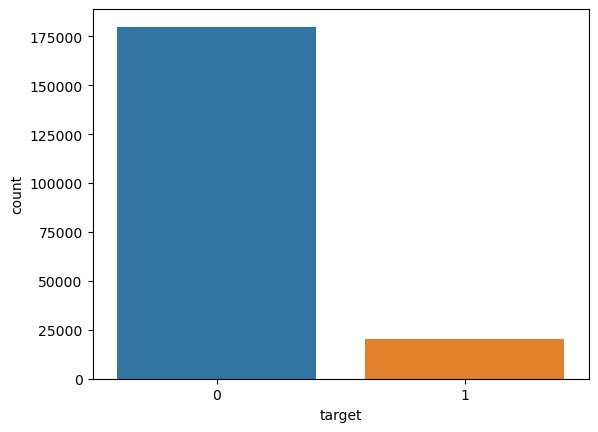

In [17]:
sns.countplot(x="target",data=data)

* From the given data more than 95% of people will not do the transaction. 
- Less than 5% of people will do the transaction.

***Observation:
     From the given data it is clear that the number of customers that will not make transaction is higher than the one's that will make transaction.***

## Data Preprocessing and Feature engineering

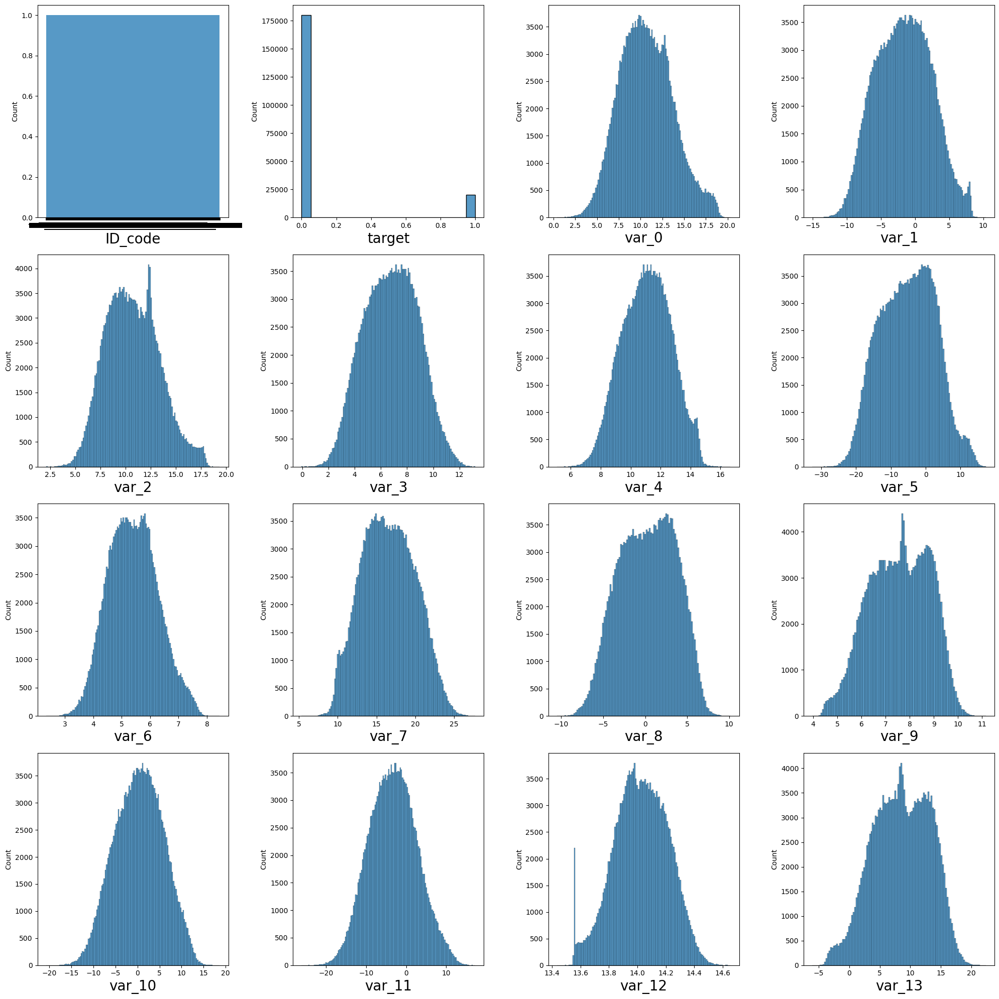

In [18]:
plt.figure(figsize=(20,20), facecolor='white')#To set canvas 
plotnumber = 1 #counter

for column in data:#accessing the columns 
    if plotnumber<=16 :
        ax = plt.subplot(4,4,plotnumber)
        sns.histplot(x=data[column])
        plt.xlabel(column,fontsize=20)#assign name to x-axis and set font-20
    plotnumber+=1#counter increment
plt.tight_layout()

In [19]:
# To view some basic statistical details like mean, standard deviation, percentile, etc

# it helps us to understand how data has been spread across the table.
# count :- the number of NoN-empty rows in a feature.
# mean :- mean value of that feature.
# std :- Standard Deviation Value of that feature.
# min :- minimum value of that feature.
# max :- maximum value of that feature.
# 25%, 50%, and 75% are the percentile/quartile of each features. 

data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


***Observation:
    The dependent (target) variable is in binary form that is the min target acquired is 0 and max is 1.***

In [20]:
data=data.drop('ID_code',axis='columns')

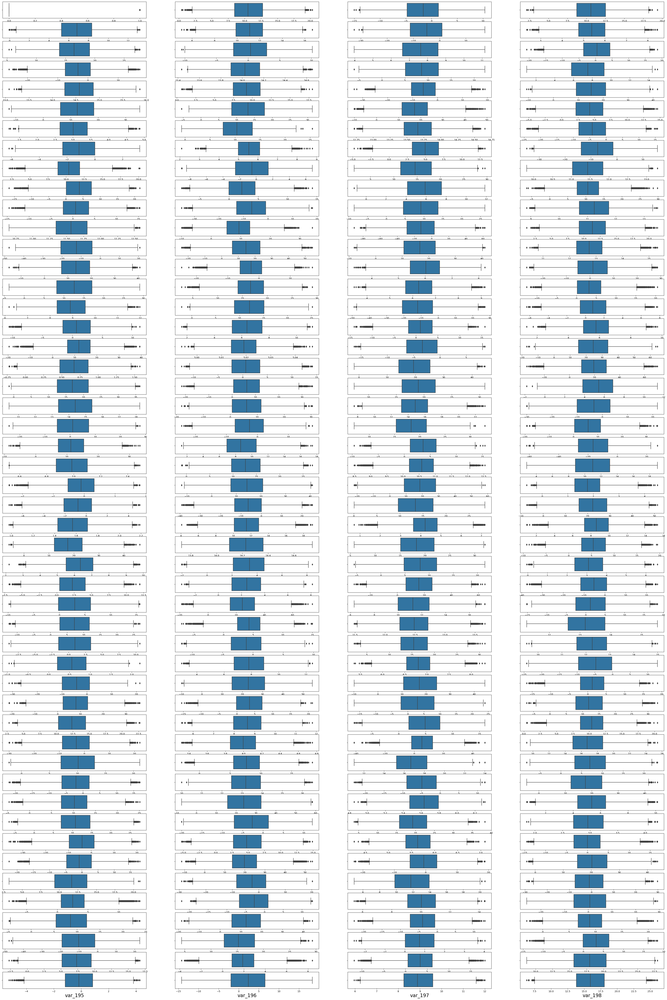

In [21]:
# Checking for outliers
# data is distributed for every column
plt.figure(figsize=(50,75), facecolor='white')
plotnumber = 1

for column in data:
    if plotnumber<=200 :
        ax = plt.subplot(50,4,plotnumber)
        sns.boxplot(data[column]) 
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

## Feature Selection

<AxesSubplot:>

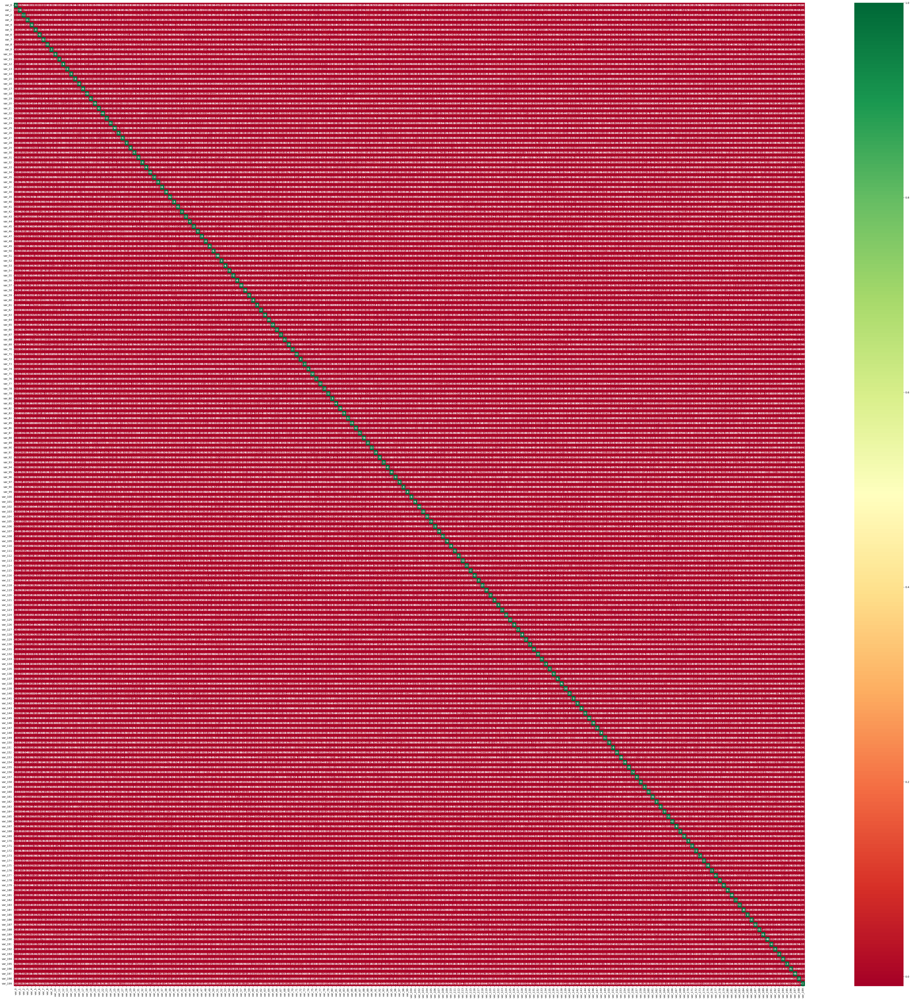

In [22]:
x1 = data.drop([ "target"], axis=1) # dropping target column
## Checking correlation

plt.figure(figsize=(70, 70))#canvas size
sns.heatmap(x1.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":10})#plotting heat map to check correlation

In [23]:
x1.corr()## Checking correlation

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,0.006983,0.002429,0.004962,-0.002613,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,0.003258,0.001511,0.004098,-0.000832,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,0.000883,-0.000991,0.002648,-0.001932,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-0.000774,0.002500,0.003553,-0.000826,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
var_4,0.001326,0.000303,0.000723,-0.000322,1.000000,-0.001368,0.000049,0.004549,0.001194,-0.000918,...,0.001514,0.004357,0.003347,0.000813,-0.000068,0.003706,0.000513,-0.000046,-0.001821,-0.000786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_195,0.002073,-0.000785,-0.001070,0.001206,0.003706,-0.001274,0.001244,0.001854,0.001396,-0.000868,...,0.004571,0.000870,-0.004745,-0.003143,-0.001201,1.000000,0.002517,-0.004170,-0.000536,0.002042
var_196,0.004386,-0.000377,0.003952,-0.002800,0.000513,0.002880,0.005378,0.001045,-0.003242,0.000052,...,-0.000847,0.002466,-0.001386,-0.005308,-0.005040,0.002517,1.000000,-0.000454,0.000253,0.000607
var_197,-0.000753,-0.004157,0.001078,0.001164,-0.000046,-0.000535,-0.003565,0.003466,-0.004583,0.003701,...,-0.004974,0.000906,-0.000527,0.005068,0.000884,-0.004170,-0.000454,1.000000,0.001183,0.004991
var_198,-0.005776,-0.004861,-0.000877,-0.001651,-0.001821,-0.000953,-0.003025,0.000650,0.002950,0.002343,...,-0.000153,-0.000067,0.003451,0.001646,0.003194,-0.000536,0.000253,0.001183,1.000000,-0.004731


***Observation:
    Since there are no observed features with high mutual correlation, we will be considering all the independent features for our model creation***

## Model Creation

## Splitting dataset into X and y

In [24]:
x = data.drop(["target"], axis=1).reset_index(drop=True) # dropped target collumn

In [25]:
y= data["target"]   #droped the target

In [26]:
## creating training and testing data
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(x, y,random_state=2)## creating training and testing data


In [27]:
# Checking the dimension of our train and test splits
print('Shape of x_train: ',X_train.shape)
print('Shape of y_train: ',y_train.shape)
print('Shape of x_test: ',X_test.shape)
print('Shape of y_test: ',y_test.shape)

Shape of x_train:  (150000, 200)
Shape of y_train:  (150000,)
Shape of x_test:  (50000, 200)
Shape of y_test:  (50000,)


## Model Building and Performation Evaluation:

## Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_train, y_train)

LogisticRegression()

In [29]:
y_pred1 = LR.predict(X_train)
y_pred1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [30]:
y_pred = LR.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [31]:
acc = accuracy_score(y_train, y_pred1)
acc

0.9129866666666666

In [32]:
acc = accuracy_score(y_test, y_pred)
acc

0.90982

In [33]:
print(classification_report(y_test, y_pred)) #test data

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     44866
           1       0.68      0.23      0.35      5134

    accuracy                           0.91     50000
   macro avg       0.80      0.61      0.65     50000
weighted avg       0.89      0.91      0.89     50000



In [34]:
print(classification_report(y_train, y_pred1)) #train data

              precision    recall  f1-score   support

           0       0.92      0.99      0.95    135036
           1       0.68      0.24      0.35     14964

    accuracy                           0.91    150000
   macro avg       0.80      0.61      0.65    150000
weighted avg       0.90      0.91      0.89    150000



***Observation:f1_score of trained and test data are around 95% for logistic regression before balancing***

## Decision Tree

In [35]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier()#object creation for decision tree  
dt.fit(X_train, y_train)#training the model


DecisionTreeClassifier()

In [36]:
y_hat=dt.predict(X_train)#prediction
y_hat#predicted values 

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

In [37]:
y_hat1=dt.predict(X_test)#prediction
y_hat

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

In [38]:
print(classification_report(y_test,y_hat1)) # test data

              precision    recall  f1-score   support

           0       0.91      0.91      0.91     44866
           1       0.21      0.22      0.21      5134

    accuracy                           0.83     50000
   macro avg       0.56      0.56      0.56     50000
weighted avg       0.84      0.83      0.84     50000



In [39]:
print(classification_report(y_train,y_hat)) # train data

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    135036
           1       1.00      1.00      1.00     14964

    accuracy                           1.00    150000
   macro avg       1.00      1.00      1.00    150000
weighted avg       1.00      1.00      1.00    150000



***Observation:
      This also shows our data is overfit since trained data gives an accuracy of 100% and tested data gives that of 90%***

## RandomForest Regression                                             

In [40]:
from sklearn.ensemble import RandomForestClassifier
MR=RandomForestClassifier(n_estimators=100)
MR.fit(X_train,y_train)

RandomForestClassifier()

In [41]:
rf_hat=MR.predict(X_train)#prediction
rf_hat#predicted values 

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

In [42]:
print(classification_report(y_train,rf_hat))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    135036
           1       1.00      1.00      1.00     14964

    accuracy                           1.00    150000
   macro avg       1.00      1.00      1.00    150000
weighted avg       1.00      1.00      1.00    150000



In [43]:
rf_pred=MR.predict(X_test)

In [44]:
print(classification_report(y_test,rf_pred))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95     44866
           1       0.00      0.00      0.00      5134

    accuracy                           0.90     50000
   macro avg       0.45      0.50      0.47     50000
weighted avg       0.81      0.90      0.85     50000



***Observation:This also shows our data is overfit since trained data gives an accuracy of 100% and tested data gives that of 95%***

### Model Fitting after Balancing
***Since our data is imbalanced we will make it balanced and then we will fit the models and evaluates the accuracy again***

In [45]:
# Install imblearn package - pip install imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [46]:
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [47]:
from collections import Counter
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 135036, 1: 14964})
SMOTE Classes Counter({0: 135036, 1: 135036})


## Logistic Regression

In [48]:
from sklearn.linear_model import LogisticRegression
LR_s = LogisticRegression()
LR_s.fit(X_smote, y_smote)

LogisticRegression()

In [49]:
y_sm_pred1 = LR_s.predict(X_smote)
y_sm_pred1

array([1, 0, 1, ..., 0, 1, 1], dtype=int64)

In [50]:
print(classification_report(y_smote,y_sm_pred1)) #training data with smote

              precision    recall  f1-score   support

           0       0.79      0.78      0.79    135036
           1       0.79      0.80      0.79    135036

    accuracy                           0.79    270072
   macro avg       0.79      0.79      0.79    270072
weighted avg       0.79      0.79      0.79    270072



In [51]:
y_pred = LR_s.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [52]:
print(classification_report(y_test,y_pred)) #test data

              precision    recall  f1-score   support

           0       0.97      0.78      0.86     44866
           1       0.28      0.76      0.41      5134

    accuracy                           0.78     50000
   macro avg       0.63      0.77      0.64     50000
weighted avg       0.90      0.78      0.82     50000



In [53]:
confusion_matrix(y_smote, y_sm_pred1)

array([[105601,  29435],
       [ 27432, 107604]], dtype=int64)

In [54]:
confusion_matrix(y_test,y_pred)

array([[35005,  9861],
       [ 1221,  3913]], dtype=int64)

***Observation:After smoting the f1_score of trained data is 79% and test data is 86%
Thus,the model is generalized.***

## Decision Tree

In [55]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier()#object creation for decision tree  
dt.fit(X_smote, y_smote)#training the model
y_hat=dt.predict(X_smote)#prediction
y_hat#predicted values 

array([0, 0, 1, ..., 1, 1, 1], dtype=int64)

In [56]:
y_test_predict2=dt.predict(X_test)#predicting training data to check training performance 
y_test_predict2

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [57]:
y_train_predict1=dt.predict(X_smote)#predicting training data to check training performance 
y_train_predict1

array([0, 0, 1, ..., 1, 1, 1], dtype=int64)

In [58]:
print(classification_report(y_smote,y_train_predict1))# it will give precision,recall,f1 scores and accuracy  #train data

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    135036
           1       1.00      1.00      1.00    135036

    accuracy                           1.00    270072
   macro avg       1.00      1.00      1.00    270072
weighted avg       1.00      1.00      1.00    270072



In [59]:
print(classification_report(y_test,y_test_predict2))# it will give precision,recall,f1 scores and accuracy #test data

              precision    recall  f1-score   support

           0       0.91      0.75      0.82     44866
           1       0.13      0.32      0.18      5134

    accuracy                           0.71     50000
   macro avg       0.52      0.54      0.50     50000
weighted avg       0.83      0.71      0.75     50000



***Observation:
    Since after smoting also it is overfitted we will generalize our data using hyperparameter tuning***

## Hyperparameter tunning for DECISION TREE

In [60]:
from sklearn.model_selection import GridSearchCV

In [61]:
#creating dictionary--> key value pair of hyperparameters having key as parameter and values as its values
params = {
    "criterion":("gini", "entropy"), #quality of split
    "splitter":("best", "random"), # searches the features for a split
    "max_depth":(list(range(1, 20))), #depth of tree range from 1 to 19
    "min_samples_split":[2, 3, 4],    #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 20)),#minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 19 
}


tree_clf = DecisionTreeClassifier(random_state=3)#object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_clf, params, scoring="f1", n_jobs=-1, verbose=3, cv=3)

#passing model to gridsearchCV 

In [62]:
tree_clf = DecisionTreeClassifier(random_state=3)#object creation for decision tree with random state 3

In [63]:
# best_params = tree_cv.best_params_#it will give you best parameters 
# print(f"Best paramters: {best_params})")#printing  best parameters

In [64]:
#fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Bestparamters: ({'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 12, 'min_samples_split': 2, 'splitter': 'best'})

In [65]:
dt1 = DecisionTreeClassifier(criterion='entropy',max_depth=19,min_samples_leaf= 12,min_samples_split=2,splitter='best')#passing best parameter to decision tree

In [66]:
dt1.fit(X_smote, y_smote)#traing model with best parameter

DecisionTreeClassifier(criterion='entropy', max_depth=19, min_samples_leaf=12)

In [67]:
y_hat1 = dt1.predict(X_test)#predicting
y_hat1

array([0, 0, 1, ..., 1, 0, 0], dtype=int64)

In [68]:
acc_test = accuracy_score(y_test, y_hat1)#checking accuracy
acc_test

0.6373

In [69]:
print(classification_report(y_test,y_hat1))#it will give precision,recall,f1 scores and accuracy #test data

              precision    recall  f1-score   support

           0       0.91      0.66      0.77     44866
           1       0.13      0.43      0.20      5134

    accuracy                           0.64     50000
   macro avg       0.52      0.54      0.48     50000
weighted avg       0.83      0.64      0.71     50000



In [70]:
y_pred_train1  = dt1.predict(X_smote)

In [71]:
print(classification_report(y_smote, y_pred_train1))   #train data

              precision    recall  f1-score   support

           0       0.91      0.78      0.84    135036
           1       0.81      0.92      0.86    135036

    accuracy                           0.85    270072
   macro avg       0.86      0.85      0.85    270072
weighted avg       0.86      0.85      0.85    270072



In [72]:
pd.crosstab(y_smote, y_pred_train1)  

col_0,0,1
target,,
0,105091,29945
1,10208,124828


***Observation:Thus after smoting and hyperparameter tuning the decision tree model is generalized with f1_score of trained data 84% and that of test data 76%***

# GradientBoosting

In [73]:
from sklearn.ensemble import GradientBoostingClassifier
dt=GradientBoostingClassifier()
dt.fit(X_smote, y_smote)

GradientBoostingClassifier()

In [74]:
y_pred2=dt.predict(X_smote)
y_pred2

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [75]:
y_pred3=dt.predict(X_test)
y_pred3

array([0, 0, 1, ..., 0, 0, 0], dtype=int64)

In [76]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,f1_score,recall_score,precision_score

In [77]:
print(classification_report(y_smote,y_pred2))   #train data

              precision    recall  f1-score   support

           0       0.84      0.86      0.85    135036
           1       0.86      0.83      0.84    135036

    accuracy                           0.85    270072
   macro avg       0.85      0.85      0.85    270072
weighted avg       0.85      0.85      0.85    270072



In [78]:
print(classification_report(y_test, y_pred3)) #test data

              precision    recall  f1-score   support

           0       0.92      0.85      0.88     44866
           1       0.21      0.35      0.26      5134

    accuracy                           0.80     50000
   macro avg       0.56      0.60      0.57     50000
weighted avg       0.85      0.80      0.82     50000



***Observation:Accuracy of train data is 84% and of test data is 80%***

## PCA

In [79]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_data=scaler.fit_transform(x)

In [80]:
## creatingnew dataframe
df=pd.DataFrame(data=scaled_data,columns=x.columns)

In [81]:
df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.577102,-1.273737,0.451707,-0.833709,0.235571,-0.536430,-0.334926,0.608751,-1.561580,-1.473796,...,0.263374,-1.149158,0.817469,-0.411013,0.168705,-1.578117,1.022131,-0.373968,-1.026398,0.214135
1,0.269959,-0.622138,1.190360,-0.688846,0.790975,1.539900,0.244461,-0.003525,0.858974,0.419300,...,0.966611,0.093605,0.443623,1.908764,-0.817594,1.522342,1.067654,-0.129400,0.825417,0.505685
2,-0.681113,-0.276066,0.516988,0.536516,-0.305477,-0.511033,1.769839,-0.564749,-1.561370,-1.307408,...,-0.072093,0.777997,-0.174131,-0.412316,1.151591,2.297370,-1.617906,-0.695141,-0.381449,0.356681
3,0.125158,-0.129426,-0.667575,0.195355,0.927992,0.410672,0.500633,-0.474201,-1.843910,0.548767,...,0.270216,-0.891456,-0.818468,-0.478548,1.607869,-0.789517,-0.959020,1.501744,0.697118,-0.543502
4,-0.277303,0.035610,0.817683,-0.077829,0.738607,0.955574,0.613372,0.791544,1.794753,0.090006,...,-1.036191,0.688988,-1.405987,1.468536,-1.501101,-0.958473,0.297627,0.645537,0.706318,-0.525375


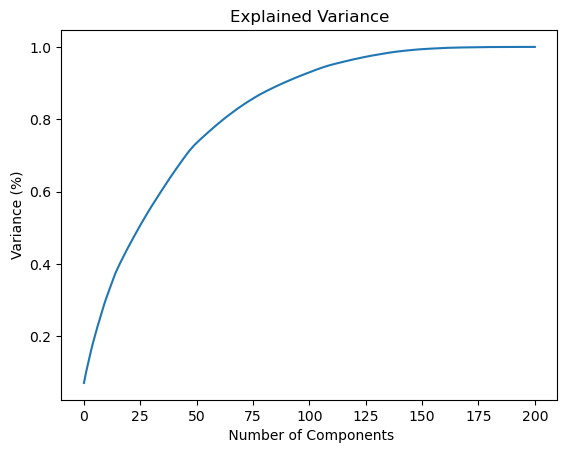

In [82]:
## Getting theoptimal number of PCA
from sklearn.decomposition import PCA
pca=PCA()
principalComponents=pca.fit_transform(data)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel(" Number of Components")
plt.ylabel('Variance (%)') # for each components
plt.title("Explained Variance")
plt.show()

In [83]:
pca=PCA(n_components=100)
new_data=pca.fit_transform(data)
i=1
for i in range(1,100):
    i=i+1
    print(i)
principal_df=pd.DataFrame(data=new_data,columns=print(i))

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
100


In [84]:
print(np.cumsum(pca.explained_variance_ratio_))

[0.07134773 0.10236891 0.12993812 0.15684934 0.18174464 0.2046242
 0.22687483 0.24792857 0.26879421 0.28896941 0.30740857 0.32484568
 0.34183977 0.35864714 0.37539506 0.38893274 0.40205154 0.41456901
 0.42688862 0.43896171 0.45068728 0.46229208 0.47375373 0.48507801
 0.49628371 0.50731827 0.51805673 0.52873581 0.53918681 0.54961744
 0.55959141 0.56948223 0.57931913 0.58899627 0.59861513 0.60822383
 0.61781386 0.62728532 0.6366286  0.64580871 0.65482996 0.66382901
 0.67262314 0.68131204 0.68992509 0.69847402 0.70688499 0.7148025
 0.72183215 0.72883801 0.73487456 0.74080212 0.74668858 0.75240313
 0.75796118 0.76350222 0.76898644 0.77444653 0.77987314 0.78524366
 0.79042745 0.79549015 0.80052243 0.8054964  0.81032557 0.81503975
 0.81967495 0.82429999 0.82880136 0.83311253 0.83741417 0.84159117
 0.84574562 0.84966701 0.85353361 0.8573646  0.86117598 0.86490086
 0.86837108 0.87171065 0.8749422  0.8781651  0.88127527 0.88436038
 0.88739375 0.89033717 0.89322875 0.89608906 0.89892    0.901665

## Fitting Models after PCA

# Logistic Regression

In [86]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_data=scaler.fit_transform(new_data)

In [88]:
X_smote_pca,X_test_pca,y_smote,y_test=train_test_split(scaled_data,y,test_size=0.2,random_state=30)

In [89]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_smote_pca, y_smote)

LogisticRegression()

In [90]:
y_pred1 = LR.predict(X_smote_pca)
y_pred1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [91]:
y_pred = LR.predict(X_test_pca)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [92]:
print(classification_report(y_test, y_pred)) #test data

              precision    recall  f1-score   support

           0       0.91      0.99      0.95     35919
           1       0.67      0.09      0.16      4081

    accuracy                           0.90     40000
   macro avg       0.79      0.54      0.56     40000
weighted avg       0.88      0.90      0.87     40000



In [93]:
print(classification_report(y_smote, y_pred1)) #train data

              precision    recall  f1-score   support

           0       0.91      0.99      0.95    143983
           1       0.64      0.09      0.15     16017

    accuracy                           0.90    160000
   macro avg       0.77      0.54      0.55    160000
weighted avg       0.88      0.90      0.87    160000



#### Observation:Accuracy of train & test are same 90%.

# Decision Tree

In [94]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier()#object creation for decision tree  
dt.fit(X_smote_pca, y_smote)#training the model
y_hat1=dt.predict(X_smote_pca)#prediction
y_hat1#predicted values 

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [95]:
y_test_predict2=dt.predict(X_test_pca)#predicting training data to check training performance 
y_test_predict2

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [96]:
y_train_predict1=dt.predict(X_smote_pca)#predicting training data to check training performance 
y_train_predict1

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [100]:
print(classification_report(y_smote,y_hat1))# it will give precision,recall,f1 scores and accuracy  #train data

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    143983
           1       1.00      1.00      1.00     16017

    accuracy                           1.00    160000
   macro avg       1.00      1.00      1.00    160000
weighted avg       1.00      1.00      1.00    160000



In [105]:
print(classification_report(y_test,y_test_predict2))# it will give precision,recall,f1 scores and accuracy #test data

              precision    recall  f1-score   support

           0       0.91      0.90      0.90     35919
           1       0.17      0.18      0.17      4081

    accuracy                           0.83     40000
   macro avg       0.54      0.54      0.54     40000
weighted avg       0.83      0.83      0.83     40000



##### Observation:This also shows our data is overfit since trained data gives an accuracy of 100% and tested data gives that of 83%.

## Gradient Boosting

In [109]:
from sklearn.ensemble import GradientBoostingClassifier
dt=GradientBoostingClassifier()
dt.fit(X_smote_pca, y_smote)

GradientBoostingClassifier()

In [110]:
y_pred2=dt.predict(X_smote_pca)
y_pred2

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [111]:
y_pred3=dt.predict(X_test_pca)
y_pred3

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [112]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,f1_score,recall_score,precision_score

In [113]:
print(classification_report(y_smote,y_pred2))   #train data

              precision    recall  f1-score   support

           0       0.90      1.00      0.95    143983
           1       0.92      0.02      0.03     16017

    accuracy                           0.90    160000
   macro avg       0.91      0.51      0.49    160000
weighted avg       0.90      0.90      0.86    160000



In [114]:
print(classification_report(y_test, y_pred3)) #test data

              precision    recall  f1-score   support

           0       0.90      1.00      0.95     35919
           1       0.78      0.01      0.02      4081

    accuracy                           0.90     40000
   macro avg       0.84      0.51      0.48     40000
weighted avg       0.89      0.90      0.85     40000



#### Observation:Accuracy of train & test are same 90%.

## Conclusion
###  *The Dataset was large, totally around 2 lakhs samples

### * The samples were highly imbalanced hence SMOTE Technique were applied on the data to balance the classes to the dataset.

### * Visualising the distribution of data & their relationships, helped us to get some insights on the relationship between the feature set.

### * Testing multiple algorithms with fine hyperparamter tuning gave some understanding on the model performance for various algorithms on this specific dataset.

### The hyperparameter tuning on dicision tree helps in the good performance on the current dataset.

### * We used Logistic Regression, Decision Tree, Random Forest, Gradient Boosting

### *The model Decision Tree with hyperparameter tunning is preferred among all the models as it gave the better accuracy.

### * At last we tried with PCA & fitted the models but we didn't get any output.
## So we are going with model DECISION TREE with hyperparameter tunning.